In [1]:
# !pip install openvino-dev

In [2]:
from icevision.all import *

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/innom-dt/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


In [3]:
import pandas as pd
pd.set_option('max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
import inspect

def inspect_default_args(target, annotations: bool=False):
    # Get the argument names
    args = inspect.getfullargspec(target).args
    # Get the default values
    defaults = inspect.getfullargspec(target).defaults

    index = ["Default Value"]

    # Pad defaults
    defaults = [None]*(len(args)-len(defaults)) + list(defaults)
    if annotations:
        index.append("Annotation")
        annotations = inspect.getfullargspec(target).annotations.values()
        # Pad annotations
        annotations = [None]*(len(args)-len(annotations)) + list(annotations)
        default_args = {arg:[df, annot] for arg,df,annot in zip(args, defaults, annotations)}
    else:
        default_args = {arg:[default] for arg,default in zip(args, defaults)}
        
    return pd.DataFrame(default_args, index=index).T


**Define path to dataset**

In [5]:
archive_dir = Path('/mnt/980SSD/Datasets/archive')
dataset_dir = archive_dir/'../data'
dataset_url = "https://cvbp-secondary.z19.web.core.windows.net/datasets/object_detection/odFridgeObjects.zip"
dataset_path = dataset_dir/'fridge'
dataset_path

Path('/mnt/980SSD/Datasets/archive/../data/fridge')

**Download the dataset**

In [6]:
icedata.load_data(dataset_url, dataset_path)

Path('/mnt/980SSD/Datasets/archive/../data/fridge')

**Inspect the dataset path**

In [7]:
pd.DataFrame(list(dataset_path.ls()))

,0
0,/mnt/980SSD/Datasets/archive/../data/fridge/odFridgeObjects
1,/mnt/980SSD/Datasets/archive/../data/fridge/odFridgeObjects.zip


In [8]:
pd.DataFrame(list(dataset_path.ls()[0].ls()))

,0
0,/mnt/980SSD/Datasets/archive/../data/fridge/odFridgeObjects/.DS_Store
1,/mnt/980SSD/Datasets/archive/../data/fridge/odFridgeObjects/annotations
2,/mnt/980SSD/Datasets/archive/../data/fridge/odFridgeObjects/images


**Get image file paths**

In [9]:
files = get_image_files(dataset_path)
len(files)

128

**Inspect files**

In [10]:
pd.DataFrame([files[0], files[-1]])

,0
0,/mnt/980SSD/Datasets/archive/../data/fridge/odFridgeObjects/images/1.jpg
1,/mnt/980SSD/Datasets/archive/../data/fridge/odFridgeObjects/images/99.jpg


**Inspect one of the training images**

Image Dims: (666, 499)


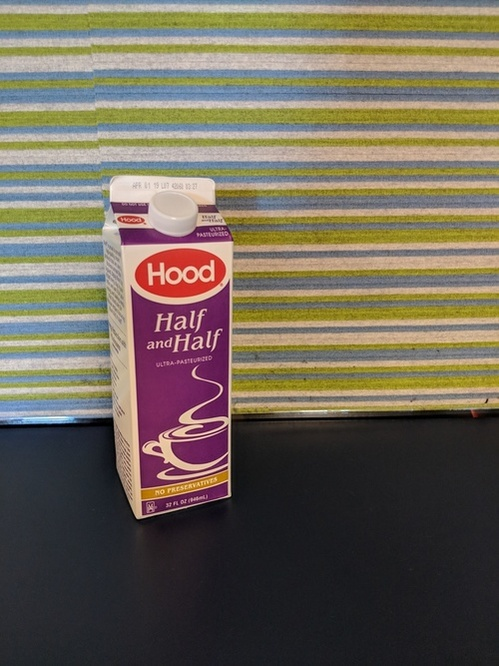

In [11]:
import PIL
img = PIL.Image.open(files[0])
print(f"Image Dims: {img.shape}")
img

**Create the BBOX parser**

In [12]:
parser = parsers.VOCBBoxParser(annotations_dir=dataset_path/"odFridgeObjects/annotations", 
                               images_dir=dataset_path/"odFridgeObjects/images")

In [13]:
# parser = parsers.COCOBBoxParser(annotations_filepath=dataset_path/"instances_train2014.json", 
#                                img_dir=dataset_path/"train2014")

**Parse annotations to create records**

In [14]:
train_records, valid_records = parser.parse()
parser.class_map

  0%|          | 0/128 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/128 [00:00<?, ?it/s]

<ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>

**Note:** The `background` class is not included in the final model.

**Select a multiple of 128 as the input resolution**

In [15]:
[128*i for i in range(1,6)]

[128, 256, 384, 512, 640]

In [16]:
image_size = 384

**Define Transforms**

In [17]:
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

**Get normalization stats**

In [18]:
norm_args = inspect_default_args(tfms.A.Normalize)
norm_args

,Default Value
self,None
mean,"(0.485, 0.456, 0.406)"
std,"(0.229, 0.224, 0.225)"
max_pixel_value,255
always_apply,False
p,1


In [19]:
mean = norm_args['Default Value']['mean']
std = norm_args['Default Value']['std']
mean, std

((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))

**Define Datasets**

In [20]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)
train_ds, valid_ds

(<Dataset with 102 items>, <Dataset with 26 items>)

**Apply augmentations to a training sample**

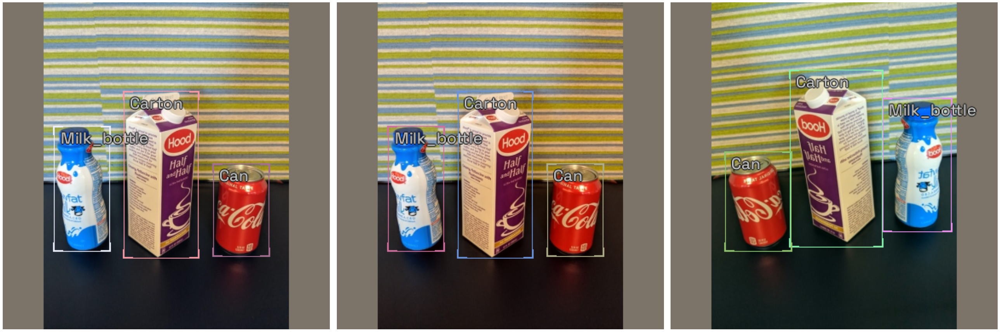

In [21]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

**Define model type**

In [22]:
# model_type = models.mmdet.retinanet
model_type = models.mmdet.yolox

**Define backbone**

In [23]:
# backbone = model_type.backbones.resnet50_fpn_1x(pretrained=True)
backbone = model_type.backbones.yolox_tiny_8x8(pretrained=True)
pd.DataFrame.from_dict(backbone.__dict__, orient='index')

,0
model_name,yolox
config_path,/home/innom-dt/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs/yolox/yolox_tiny_8x8_300e_coco.py
weights_url,https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_tiny_8x8_300e_coco/yolox_tiny_8x8_300e_coco_20210806_234250-4ff3b67e.pth
pretrained,True


In [24]:
import mmcv
cfg = mmcv.Config.fromfile(backbone.config_path)
pd.DataFrame(pd.DataFrame.from_dict(cfg.__dict__)['_cfg_dict'])

,_cfg_dict
checkpoint_config,{'interval': 10}
custom_hooks,"[{'type': 'YOLOXModeSwitchHook', 'num_last_epochs': 15, 'priority': 48}, {'type': 'SyncRandomSizeHook', 'ratio_range': (10, 20), 'img_scale': (640, 640), 'interval': 10, 'priority': 48}, {'type': 'SyncNormHook', 'num_last_epochs': 15, 'interval': 10, 'priority': 48}, {'type': 'ExpMomentumEMAHook', 'resume_from': None, 'priority': 49}]"
data,"{'samples_per_gpu': 8, 'workers_per_gpu': 2, 'train': {'type': 'MultiImageMixDataset', 'dataset': {'type': 'CocoDataset', 'ann_file': 'data/coco/annotations/instances_train2017.json', 'img_prefix': 'data/coco/train2017/', 'pipeline': [{'type': 'LoadImageFromFile', 'to_float32': True}, {'type': 'LoadAnnotations', 'with_bbox': True}], 'filter_empty_gt': False}, 'pipeline': [{'type': 'Mosaic', 'img_scale': (640, 640), 'pad_val': 114.0}, {'type': 'RandomAffine', 'scaling_ratio_range': (0.5, 1.5), 'border': (-320, -320)}, {'type': 'PhotoMetricDistortion', 'brightness_delta': 32, 'contrast_range': (0.5, 1.5), 'saturation_range': (0.5, 1.5), 'hue_delta': 18}, {'type': 'RandomFlip', 'flip_ratio': 0.5}, {'type': 'Resize', 'keep_ratio': True}, {'type': 'Pad', 'pad_to_square': True, 'pad_val': 114.0}, {'type': 'Normalize', 'mean': [123.675, 116.28, 103.53], 'std': [58.395, 57.12, 57.375], 'to_rgb': True}, {'type': 'DefaultFormatBundle'}, {'type': 'Collect', 'keys': ['img', 'gt_bboxes', 'gt_labels']}], 'dynamic_scale': (640, 640)}, 'val': {'type': 'CocoDataset', 'ann_file': 'data/coco/annotations/instances_val2017.json', 'img_prefix': 'data/coco/val2017/', 'pipeline': [{'type': 'LoadImageFromFile'}, {'type': 'MultiScaleFlipAug', 'img_scale': (416, 416), 'flip': False, 'transforms': [{'type': 'Resize', 'keep_ratio': True}, {'type': 'RandomFlip'}, {'type': 'Pad', 'size': (416, 416), 'pad_val': 114.0}, {'type': 'Normalize', 'mean': [123.675, 116.28, 103.53], 'std': [58.395, 57.12, 57.375], 'to_rgb': True}, {'type': 'DefaultFormatBundle'}, {'type': 'Collect', 'keys': ['img']}]}]}, 'test': {'type': 'CocoDataset', 'ann_file': 'data/coco/annotations/instances_val2017.json', 'img_prefix': 'data/coco/val2017/', 'pipeline': [{'type': 'LoadImageFromFile'}, {'type': 'MultiScaleFlipAug', 'img_scale': (416, 416), 'flip': False, 'transforms': [{'type': 'Resize', 'keep_ratio': True}, {'type': 'RandomFlip'}, {'type': 'Pad', 'size': (416, 416), 'pad_val': 114.0}, {'type': 'Normalize', 'mean': [123.675, 116.28, 103.53], 'std': [58.395, 57.12, 57.375], 'to_rgb': True}, {'type': 'DefaultFormatBundle'}, {'type': 'Collect', 'keys': ['img']}]}]}}"
data_root,data/coco/
dataset_type,CocoDataset
dist_params,{'backend': 'nccl'}
evaluation,"{'interval': 10, 'metric': 'bbox'}"
img_norm_cfg,"{'mean': [123.675, 116.28, 103.53], 'std': [58.395, 57.12, 57.375], 'to_rgb': True}"
img_scale,"(640, 640)"
interval,10


**Define DataLoaders**

In [25]:
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

**Verify DataLoaders**

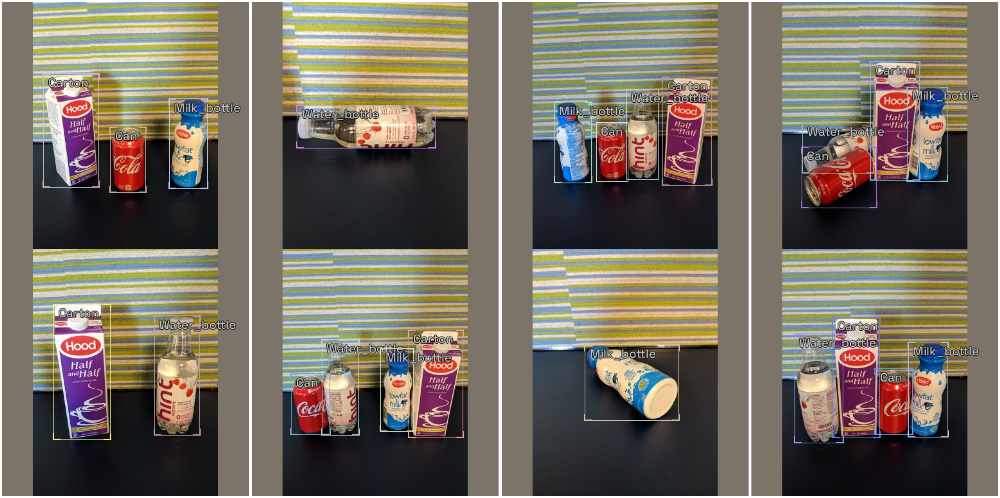

In [26]:
model_type.show_batch(first(valid_dl), ncols=4)

**Instantiate the model**

In [27]:
extra_args = {}

In [28]:
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

2022-07-19 18:28:51,743 - mmcv - INFO - initialize CSPDarknet with init_cfg {'type': 'Kaiming', 'layer': 'Conv2d', 'a': 2.23606797749979, 'distribution': 'uniform', 'mode': 'fan_in', 'nonlinearity': 'leaky_relu'}
2022-07-19 18:28:51,755 - mmcv - INFO - initialize YOLOXPAFPN with init_cfg {'type': 'Kaiming', 'layer': 'Conv2d', 'a': 2.23606797749979, 'distribution': 'uniform', 'mode': 'fan_in', 'nonlinearity': 'leaky_relu'}
2022-07-19 18:28:51,769 - mmcv - INFO - initialize YOLOXHead with init_cfg {'type': 'Kaiming', 'layer': 'Conv2d', 'a': 2.23606797749979, 'distribution': 'uniform', 'mode': 'fan_in', 'nonlinearity': 'leaky_relu'}
2022-07-19 18:28:51,778 - mmcv - INFO - 
backbone.stem.conv.conv.weight - torch.Size([24, 12, 3, 3]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,778 - mmcv - INFO - 
backbone.stem.conv.bn.weight - torch.Size([24]): 
The value is the same before and after calling `init_weights` of

2022-07-19 18:28:51,788 - mmcv - INFO - 
backbone.stage2.1.blocks.1.conv1.bn.bias - torch.Size([48]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,789 - mmcv - INFO - 
backbone.stage2.1.blocks.1.conv2.conv.weight - torch.Size([48, 48, 3, 3]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,789 - mmcv - INFO - 
backbone.stage2.1.blocks.1.conv2.bn.weight - torch.Size([48]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,789 - mmcv - INFO - 
backbone.stage2.1.blocks.1.conv2.bn.bias - torch.Size([48]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,789 - mmcv - INFO - 
backbone.stage2.1.blocks.2.conv1.conv.weight - torch.Size([48, 48, 1, 1]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,78

2022-07-19 18:28:51,797 - mmcv - INFO - 
backbone.stage4.1.conv1.bn.weight - torch.Size([192]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,797 - mmcv - INFO - 
backbone.stage4.1.conv1.bn.bias - torch.Size([192]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,797 - mmcv - INFO - 
backbone.stage4.1.conv2.conv.weight - torch.Size([384, 768, 1, 1]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,798 - mmcv - INFO - 
backbone.stage4.1.conv2.bn.weight - torch.Size([384]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,798 - mmcv - INFO - 
backbone.stage4.1.conv2.bn.bias - torch.Size([384]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,798 - mmcv - INFO - 
backbone.stage4.2.main_conv.conv.weight - torch.Size([192, 38

2022-07-19 18:28:51,806 - mmcv - INFO - 
neck.top_down_blocks.1.main_conv.bn.bias - torch.Size([48]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,806 - mmcv - INFO - 
neck.top_down_blocks.1.short_conv.conv.weight - torch.Size([48, 192, 1, 1]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,808 - mmcv - INFO - 
neck.top_down_blocks.1.short_conv.bn.weight - torch.Size([48]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,808 - mmcv - INFO - 
neck.top_down_blocks.1.short_conv.bn.bias - torch.Size([48]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,809 - mmcv - INFO - 
neck.top_down_blocks.1.final_conv.conv.weight - torch.Size([96, 96, 1, 1]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:

2022-07-19 18:28:51,822 - mmcv - INFO - 
neck.bottom_up_blocks.1.blocks.0.conv1.conv.weight - torch.Size([192, 192, 1, 1]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,822 - mmcv - INFO - 
neck.bottom_up_blocks.1.blocks.0.conv1.bn.weight - torch.Size([192]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,822 - mmcv - INFO - 
neck.bottom_up_blocks.1.blocks.0.conv1.bn.bias - torch.Size([192]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,822 - mmcv - INFO - 
neck.bottom_up_blocks.1.blocks.0.conv2.conv.weight - torch.Size([192, 192, 3, 3]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,822 - mmcv - INFO - 
neck.bottom_up_blocks.1.blocks.0.conv2.bn.weight - torch.Size([192]): 
The value is the same before and after calling `init_weigh

2022-07-19 18:28:51,832 - mmcv - INFO - 
bbox_head.multi_level_reg_convs.1.1.bn.weight - torch.Size([96]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,832 - mmcv - INFO - 
bbox_head.multi_level_reg_convs.1.1.bn.bias - torch.Size([96]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,832 - mmcv - INFO - 
bbox_head.multi_level_reg_convs.2.0.conv.weight - torch.Size([96, 96, 3, 3]): 
KaimingInit: a=2.23606797749979, mode=fan_in, nonlinearity=leaky_relu, distribution =uniform, bias=0 
 
2022-07-19 18:28:51,832 - mmcv - INFO - 
bbox_head.multi_level_reg_convs.2.0.bn.weight - torch.Size([96]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,832 - mmcv - INFO - 
bbox_head.multi_level_reg_convs.2.0.bn.bias - torch.Size([96]): 
The value is the same before and after calling `init_weights` of YOLOX  
 
2022-07-19 18:28:51,833 - mmcv - INFO - 
bbox_he

Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.multi_level_conv_cls.0.weight: copying a param with shape torch.Size([80, 96, 1, 1]) from checkpoint, the shape in current model is torch.Size([4, 96, 1, 1]).
size mismatch for bbox_head.multi_level_conv_cls.0.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([4]).
size mismatch for bbox_head.multi_level_conv_cls.1.weight: copying a param with shape torch.Size([80, 96, 1, 1]) from checkpoint, the shape in current model is torch.Size([4, 96, 1, 1]).
size mismatch for bbox_head.multi_level_conv_cls.1.bias: copying a param with shape torch.Size([80]) from checkpoint, the shape in current model is torch.Size([4]).
size mismatch for bbox_head.multi_level_conv_cls.2.weight: copying a param with shape torch.Size([80, 96, 1, 1]) from checkpoint, the shape in current model is torch.Size([4, 96, 1, 1]).
size mismatch for bbox_head.

**Define metrics**

In [29]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

**Define Learner object**

In [30]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

**Find learning rate**

SuggestedLRs(valley=0.0003311311302240938)

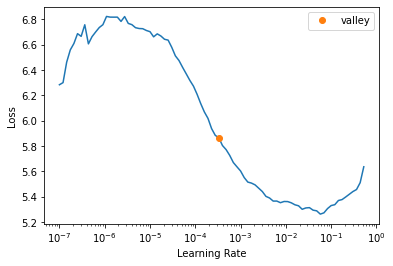

In [31]:
learn.lr_find()

**Define learning rate**

In [32]:
lr = 1e-3

**Define number of epochs**

In [33]:
epochs = 30

**Finetune model**

In [34]:
learn.fine_tune(epochs, lr, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,4.909100,4.568086,0.486602,00:01


epoch,train_loss,valid_loss,COCOMetric,time
0,3.578913,3.037747,0.680871,00:01
1,3.168532,1.899492,0.851391,00:01
2,2.947619,2.007544,0.807335,00:01
3,2.794050,1.791530,0.804020,00:01
4,2.679781,1.872153,0.796221,00:01
5,2.602635,2.381947,0.727302,00:01
6,2.566911,1.762449,0.830934,00:01
7,2.545779,2.081448,0.765513,00:01
8,2.435272,2.057227,0.750816,00:01
9,2.357614,1.905962,0.809153,00:01


**Create an inference dataloader using the validation set**

In [35]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)

**Get model predictions**

  0%|          | 0/7 [00:00<?, ?it/s]

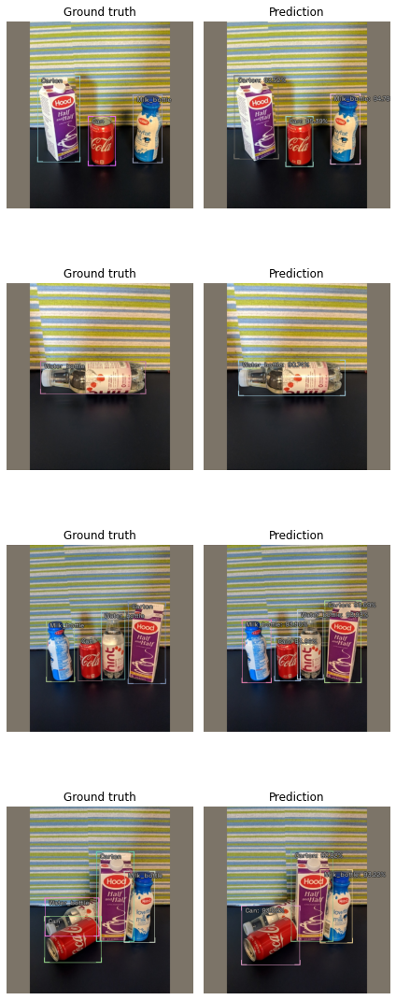

In [36]:
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)
show_preds(preds=preds[:4])

**Define method to convert a PIL Image to a Pytorch Tensor**

In [37]:
def img_to_tensor(img:PIL.Image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    # Convert image to tensor
    img_tensor = torch.Tensor(np.array(img)).permute(2, 0, 1)
    # Scale pixels values from [0,255] to [0,1]
    scaled_tensor = img_tensor.float().div_(255)
    # Prepare normalization tensors
    mean_tensor = tensor(mean).view(1,1,-1).permute(2, 0, 1)
    std_tensor = tensor(std).view(1,1,-1).permute(2, 0, 1)
    # Normalize tensor    
    normalized_tensor = (scaled_tensor - mean_tensor) / std_tensor
    # Batch tensor
    return normalized_tensor.unsqueeze(dim=0)

**Select a test image**

In [38]:
test_file = files[0]
test_file.name

'1.jpg'

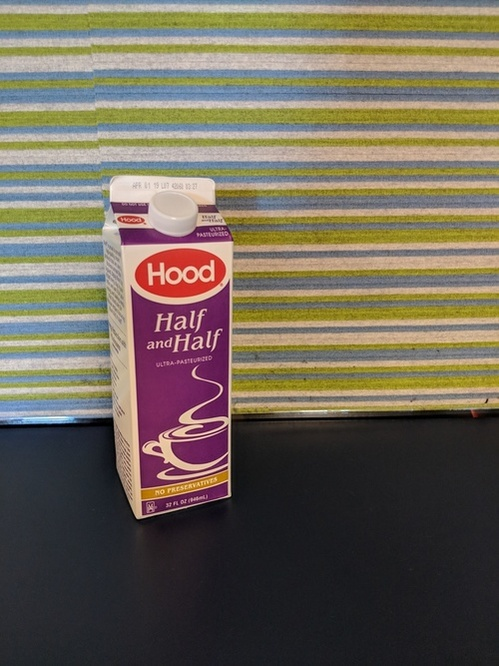

In [39]:
test_img = PIL.Image.open(test_file).convert('RGB')
test_img

In [40]:
# stride_val = 128
stride_val = 32

In [41]:
input_h = test_img.height - (test_img.height % stride_val)
input_w = test_img.width - (test_img.width % stride_val)
input_h, input_w

(640, 480)

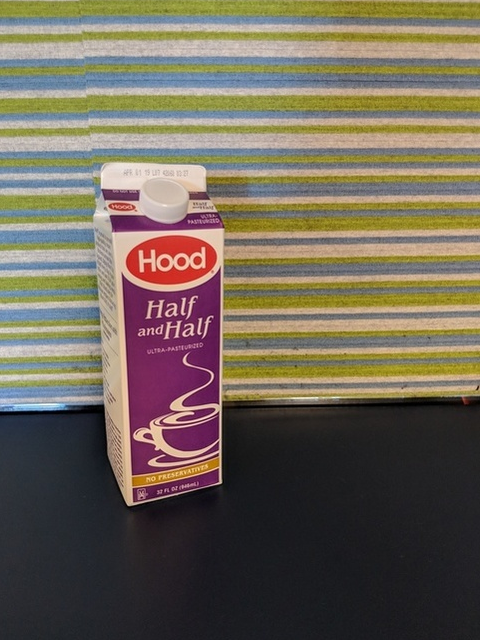

In [42]:
test_img = test_img.crop_pad((input_w, input_h))
# test_img = test_img.resize((input_w, input_h))
test_img

In [43]:
test_tensor = img_to_tensor(test_img, mean=mean, std=std)
test_tensor.shape

torch.Size([1, 3, 640, 480])

In [44]:
origin_forward = model.forward

In [45]:
model.forward = model.forward_dummy

In [46]:
model_output = model.cpu()(test_tensor.cpu())

In [47]:
for raw_out in model_output:
    for out in raw_out:
        print(out.shape)

torch.Size([1, 4, 80, 60])
torch.Size([1, 4, 40, 30])
torch.Size([1, 4, 20, 15])
torch.Size([1, 4, 80, 60])
torch.Size([1, 4, 40, 30])
torch.Size([1, 4, 20, 15])
torch.Size([1, 1, 80, 60])
torch.Size([1, 1, 40, 30])
torch.Size([1, 1, 20, 15])


In [48]:
def forward_export(self, input_tensor):
    # Get raw model output
    model_output = self.forward_dummy(input_tensor.cpu())
    # Extract class scores
    cls_scores = model_output[0]
    # Extract bounding box predictions
    bbox_preds = model_output[1]
    # Extract objectness scores
    objectness = model_output[2]
    
    stride_8_cls = torch.sigmoid(cls_scores[0])
    stride_8_bbox = bbox_preds[0]
    stride_8_objectness = torch.sigmoid(objectness[0])
#     stride_8_cat = torch.cat((stride_8_cls, stride_8_bbox, stride_8_objectness), dim=1)
    stride_8_cat = torch.cat((stride_8_bbox, stride_8_objectness, stride_8_cls), dim=1)
    stride_8_flat = torch.flatten(stride_8_cat, start_dim=2)

    stride_16_cls = torch.sigmoid(cls_scores[1])
    stride_16_bbox = bbox_preds[1]
    stride_16_objectness = torch.sigmoid(objectness[1])
#     stride_16_cat = torch.cat((stride_16_cls, stride_16_bbox, stride_16_objectness), dim=1)
    stride_16_cat = torch.cat((stride_16_bbox, stride_16_objectness, stride_16_cls), dim=1)
    stride_16_flat = torch.flatten(stride_16_cat, start_dim=2)

    stride_32_cls = torch.sigmoid(cls_scores[2])
    stride_32_bbox = bbox_preds[2]
    stride_32_objectness = torch.sigmoid(objectness[2])
#     stride_32_cat = torch.cat((stride_32_cls, stride_32_bbox, stride_32_objectness), dim=1)
    stride_32_cat = torch.cat((stride_32_bbox, stride_32_objectness, stride_32_cls), dim=1)
    stride_32_flat = torch.flatten(stride_32_cat, start_dim=2)

    full_cat = torch.cat((stride_8_flat, stride_16_flat, stride_32_flat), dim=2)

    return full_cat.permute(0, 2, 1)

In [49]:
model.forward_export = forward_export.__get__(model)

In [50]:
model.forward_export(test_tensor).shape

torch.Size([1, 6300, 9])

In [51]:
model.forward = model.forward_export

In [52]:
model(test_tensor).shape

torch.Size([1, 6300, 9])

In [53]:
parser.class_map

<ClassMap: {'background': 0, 'carton': 1, 'milk_bottle': 2, 'can': 3, 'water_bottle': 4}>

In [54]:
cls_out_channels = parser.class_map.num_classes - 1
cls_out_channels

4

In [55]:
onnx_file_name = f"{dataset_path.name}-{type(learn.model.model).__name__}.onnx"
onnx_file_name

'fridge-YOLOX.onnx'

In [56]:
torch.onnx.export(model,
                  test_tensor,
                  onnx_file_name,
                  export_params=True,
                  opset_version=11,
                  do_constant_folding=True,
                  input_names = ['input'],
                  output_names = ['output'],
                  dynamic_axes={'input': {2 : 'height', 3 : 'width'}}
                 )

In [57]:
from IPython.display import Markdown, display

In [58]:
from openvino.runtime import Core

In [59]:
output_dir = Path('./')
output_dir

Path('.')

In [60]:
ir_path = Path(f"{onnx_file_name.split('.')[0]}.xml")
ir_path

Path('fridge-YOLOX.xml')

In [61]:
# Construct the command for Model Optimizer
mo_command = f"""mo
                 --input_model "{onnx_file_name}"
                 --input_shape "[1,3, {image_size}, {image_size}]"
                 --mean_values="{mean}"
                 --scale_values="{std}"
                 --data_type FP16
                 --output_dir "{output_dir}"
                 """
mo_command = " ".join(mo_command.split())
print("Model Optimizer command to convert the ONNX model to OpenVINO:")
display(Markdown(f"`{mo_command}`"))

Model Optimizer command to convert the ONNX model to OpenVINO:


`mo --input_model "fridge-YOLOX.onnx" --input_shape "[1,3, 384, 384]" --mean_values="(0.485, 0.456, 0.406)" --scale_values="(0.229, 0.224, 0.225)" --data_type FP16 --output_dir "."`

In [62]:
if not ir_path.exists():
    print("Exporting ONNX model to IR... This may take a few minutes.")
    mo_result = %sx $mo_command
    print("\n".join(mo_result))
else:
    print(f"IR model {ir_path} already exists.")

Exporting ONNX model to IR... This may take a few minutes.
Model Optimizer arguments:
Common parameters:
	- Path to the Input Model: 	/media/innom-dt/Samsung_T3/My_Environments/jupyter-notebooks/icevision/fridge-YOLOX.onnx
	- Path for generated IR: 	/media/innom-dt/Samsung_T3/My_Environments/jupyter-notebooks/icevision/.
	- IR output name: 	fridge-YOLOX
	- Log level: 	ERROR
	- Batch: 	Not specified, inherited from the model
	- Input layers: 	Not specified, inherited from the model
	- Output layers: 	Not specified, inherited from the model
	- Input shapes: 	[1,3, 384, 384]
	- Source layout: 	Not specified
	- Target layout: 	Not specified
	- Layout: 	Not specified
	- Mean values: 	(0.485, 0.456, 0.406)
	- Scale values: 	(0.229, 0.224, 0.225)
	- Scale factor: 	Not specified
	- Precision of IR: 	FP16
	- Enable fusing: 	True
	- User transformations: 	Not specified
	- Reverse input channels: 	False
	- Enable IR generation for fixed input shape: 	False
	- Use the transformations config file: 

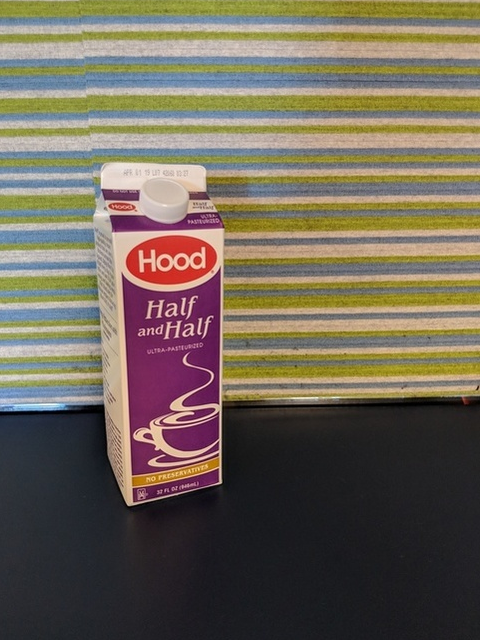

In [63]:
test_img

In [64]:
# Convert image to tensor
img_tensor = torch.Tensor(np.array(test_img)).permute(2, 0, 1)
# Scale pixels values from [0,255] to [0,1]
scaled_tensor = img_tensor.float().div_(255)

In [65]:
input_image = scaled_tensor.unsqueeze(dim=0)
input_image.shape

torch.Size([1, 3, 640, 480])

In [66]:
ir_path

Path('fridge-YOLOX.xml')

In [67]:
# Load the network in Inference Engine
ie = Core()
model_ir = ie.read_model(model=ir_path)
model_ir.reshape(input_image.shape)
compiled_model_ir = ie.compile_model(model=model_ir, device_name="CPU")

# Get input and output layers
input_layer_ir = next(iter(compiled_model_ir.inputs))
output_layer_ir = next(iter(compiled_model_ir.outputs))

# Run inference on the input image
res_ir = compiled_model_ir([input_image])[output_layer_ir]

**Benchmark OpenVINO IR CPU inference speed**

In [68]:
%%timeit
compiled_model_ir([input_image])[output_layer_ir]

19.2 ms ± 109 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [69]:
compiled_model_ir([input_image])[output_layer_ir].shape

(1, 6300, 9)

In [70]:
!pip install distinctipy

In [71]:
import matplotlib.pyplot as plt
import numpy as np

In [72]:
labels = parser.class_map.get_classes()[1:]
labels

['carton', 'milk_bottle', 'can', 'water_bottle']

In [73]:
precision = 5

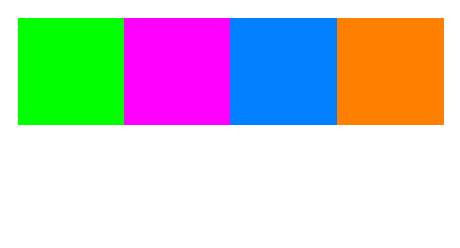

In [74]:
from distinctipy import distinctipy


# number of colours to generate
N = len(labels)
# generate N visually distinct colours
colors = distinctipy.get_colors(N)

# display the colours
distinctipy.color_swatch(colors)

In [75]:
colors = [list(np.random.random(size=3).round(precision)) for label in labels]
colors

[[0.1583, 0.8625, 0.23597],
 [0.4083, 0.20284, 0.35956],
 [0.0408, 0.21456, 0.666],
 [0.60176, 0.72458, 0.03401]]

In [76]:
bbox_info = {'items': list()}
bbox_info['items'] = [{'label': label, 'color': color} for label, color in zip(labels, colors)]
bbox_info

{'items': [{'label': 'carton', 'color': [0.1583, 0.8625, 0.23597]},
  {'label': 'milk_bottle', 'color': [0.4083, 0.20284, 0.35956]},
  {'label': 'can', 'color': [0.0408, 0.21456, 0.666]},
  {'label': 'water_bottle', 'color': [0.60176, 0.72458, 0.03401]}]}

In [77]:
bbox_info['items'][0]

{'label': 'carton', 'color': [0.1583, 0.8625, 0.23597]}

In [78]:
dataset_path.name

'fridge'

In [79]:
import json

bbox_info_file_name = f"{dataset_path.name}-colormap.json"

with open(bbox_info_file_name, "w") as write_file:
    json.dump(bbox_info, write_file)

In [80]:
labels_cpp_file_name = f'{dataset_path.name}-labels-cpp.txt'
colormap_cpp_file_name = f'{dataset_path.name}-colormap-cpp.txt'

with open(labels_cpp_file_name, "w") as write_file:
    write_file.write(str(labels).replace("'", '"').replace("[", '{').replace("]", '}'))

with open(colormap_cpp_file_name, "w") as write_file:
    write_file.write(str(colors).replace("'", '"').replace("[", '{').replace("]", '}'))